In [1]:
using Pkg
Pkg.activate(".")

  Activating project at `~/Desktop/PhD_Stuff/cheb_bessel_tests-main`


In [2]:
using BenchmarkTools
using LinearAlgebra
using DataInterpolations
using SpecialFunctions
using HCubature
using QuadGK
using Polynomials
using Plots
using FastChebInterp
using ProgressBars
using LaTeXStrings
using Bessels
using Tullio
using FFTW
using LoopVectorization
using NPZ
using Interpolations

[ Info: Precompiling HCubature [19dc6840-f33b-545b-b366-655c7e3ffd49]
[ Info: Precompiling Polynomials [f27b6e38-b328-58d1-80ce-0feddd5e7a45]
[ Info: Precompiling ConstructionBaseStaticArraysExt [8497ba20-d017-5d93-8a79-2639523b7219]
[ Info: Precompiling Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80]
Precompiling IJuliaExt
  ✓ XSLT_jll
  ✓ Plots → FileIOExt
  ✓ Plots → UnitfulExt
  ✓ Plots → IJuliaExt
  4 dependencies successfully precompiled in 58 seconds. 163 already precompiled.
[ Info: Precompiling IJuliaExt [2f4121a4-3b3a-5ce6-9c5e-1f2673ce168a]
┌ Warning: Module Plots with build ID fafbfcfd-990a-dbaf-0005-80e74c8a25ca is missing from the cache.
│ This may mean Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80] does not support precompilation but is imported by a module that does.
└ @ Base loading.jl:1942
[ Info: Skipping precompilation since __precompile__(false). Importing IJuliaExt [2f4121a4-3b3a-5ce6-9c5e-1f2673ce168a].
[ Info: Precompiling FastChebInterp [cf66c380-9a80-432c-aff8-4f9c

In [3]:
using Revise
using Will

Precompiling Will
  ✓ DSP
  ✓ ToeplitzMatrices
  ✓ ToeplitzMatrices → ToeplitzMatricesStatsBaseExt
  ✓ FastTransforms
  ✓ Will
  5 dependencies successfully precompiled in 21 seconds. 246 already precompiled.
[ Info: Precompiling Will [cb9b9ae6-2b2a-43a5-b438-03a85e768462]
┌ Warning: Module FastChebInterp with build ID fafbfcfd-b726-734e-0005-8100f155b2e0 is missing from the cache.
│ This may mean FastChebInterp [cf66c380-9a80-432c-aff8-4f9c79c0bdde] does not support precompilation but is imported by a module that does.
└ @ Base loading.jl:1942
[ Info: Skipping precompilation since __precompile__(false). Importing Will [cb9b9ae6-2b2a-43a5-b438-03a85e768462].
[ Info: Precompiling FastTransforms [057dd010-8810-581a-b7be-e3fc3b93f78c]
┌ Warning: Module Polynomials with build ID fafbfcfd-d7ff-6a90-0005-80e4be54b2e7 is missing from the cache.
│ This may mean Polynomials [f27b6e38-b328-58d1-80ce-0feddd5e7a45] does not support precompilation but is imported by a module that does.
└ @ Base loa

In [4]:
#Polynomial Approximation of P(k)
function TGA(k, ωb, ωm)
    y = k / (ωm - ωb)
    return (1 + 56.4933 * y^1.48261 + 3559.23* y^3.76407 + 4982.44 *y^5.68246 + 374.167* y^7.14558)^(-0.25)
end

function Pk(k, ωb, ωm, ns)
    return k^ns * TGA(k, ωm, ωb)^2
end

#@benchmark TGA($1, $0.02, $0.1)

Pk (generic function with 1 method)

In [5]:
#Cheb interpolant in log(k)---->To use FFTlog
kmax = 200/13 #N5K challenge values
kmin = 2.5/7000
n_cheb = 128
k = LinRange(kmin, kmax, 40000)
x = chebpoints(n_cheb, log10(kmin), log10(kmax))
c = chebinterp(Pk.(10 .^x, 0.15, 0.02, 0.96), log10(kmin), log10(kmax));

In [6]:
@time Pk.(10 .^x, 0.15, 0.02, 0.96);

  0.000025 seconds (3 allocations: 1.141 KiB)


# $\ell = 5$

In [7]:
T = npzread("T_tilde/T_tilde_l_5.npy");

In [8]:
ℓ = 5
nχ = 100
χ = LinRange(13, 7000, nχ)

100-element LinRange{Float64, Int64}:
 13.0, 83.5758, 154.152, 224.727, …, 6788.27, 6858.85, 6929.42, 7000.0

In [9]:
coeff = zeros(nχ,nχ,n_cheb+1)
for i in 1:nχ
    for j in 1:nχ
        coeff[i,j,:]=c.coefs
    end
end

In [10]:
w = Will.w_ell_tullio(coeff,T);

In [11]:
@benchmark Will.w_ell_tullio(coeff,T)

BenchmarkTools.Trial: 10000 samples with 1 evaluation.
 Range (min … max):  450.458 μs …   3.579 ms  ┊ GC (min … max): 0.00% … 0.00%
 Time  (median):     466.708 μs               ┊ GC (median):    0.00%
 Time  (mean ± σ):   490.535 μs ± 112.499 μs  ┊ GC (mean ± σ):  0.40% ± 2.44%

  ▆█▇▆▄▂▁▂▂                                                     ▁
  ███████████▇▇▇▆▅▆▆▆▅▆▅▅▂▅▅▅▅▆▄▅▅▄▆▅▅▄▆▅▇▅▆▅▄▆▆▅▆▆▅▆▅▅▅▆▆▆▅▅▄▅ █
  450 μs        Histogram: log(frequency) by time        922 μs <

 Memory estimate: 80.75 KiB, allocs estimate: 49.

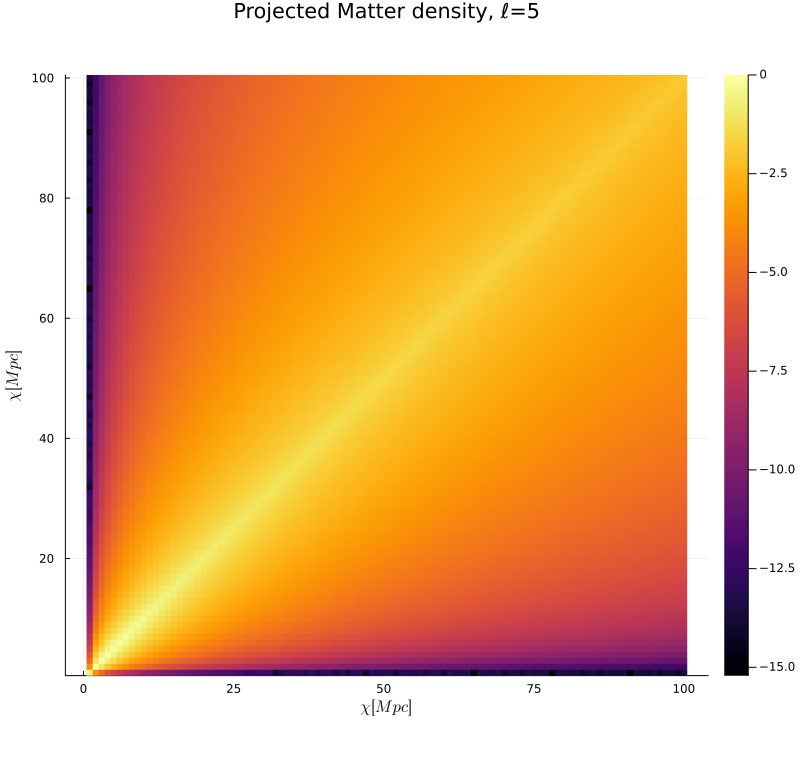

In [12]:
heatmap(log10.(abs.(w[1,:,:]./maximum(w[1,:,:]))), aspect_ratio=1, size=[800,770], xlabel=L"\chi [Mpc]", ylabel=L"\chi [Mpc]", title="Projected Matter density, ℓ=5")

### Comparison with brute force integral

In [13]:
function integral!(result, f, kmin, kmax, i, j)
    int, err = hquadrature(f, kmin, kmax; rtol=sqrt(1e-11), atol=0, maxevals=Int(1e7), initdiv=1)
    result[i,j] = int
    result[j,i] = int
    return nothing
end

function brute_w!(result, ℓ, χ, kmin, kmax)
    for i in 1:length(χ)
        println("Processing all results for i = $i")
        Threads.@threads for j in i:length(χ)
            benchmark_f(x) = Bessels.sphericalbesselj.(ℓ, χ[i] * x) * Bessels.sphericalbesselj.(ℓ, χ[j] * x) * Pk.(x, 0.15, 0.02, 0.96)
            integral!(result, benchmark_f, kmin, kmax, i, j)
        end
    end
end

brute_w! (generic function with 1 method)

result_brute_5 = zeros(nχ, nχ)
brute_w!(result_brute_5, ℓ, χ, kmin, kmax)

In [14]:
result_brute_5 = npzread("w_brute/w_l_5_brute.npy");

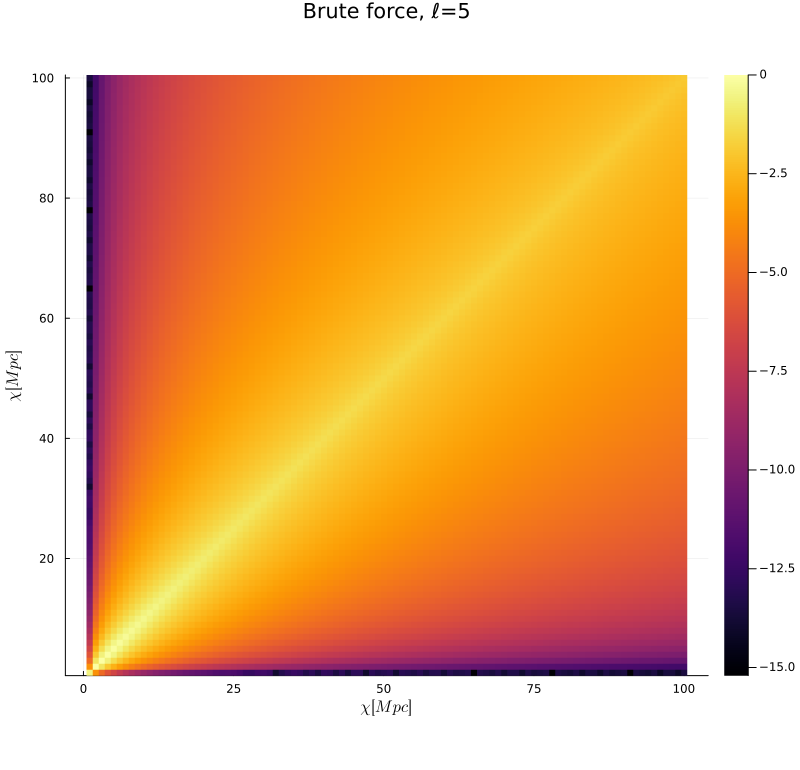

In [15]:
heatmap(log10.(abs.(result_brute_5/maximum(result_brute_5))), aspect_ratio=1, size=[800,770], xlabel=L"\chi [Mpc]", ylabel=L"\chi [Mpc]", title="Brute force, ℓ=5")

npzwrite("w_l_5_brute.npy", result_brute_5)

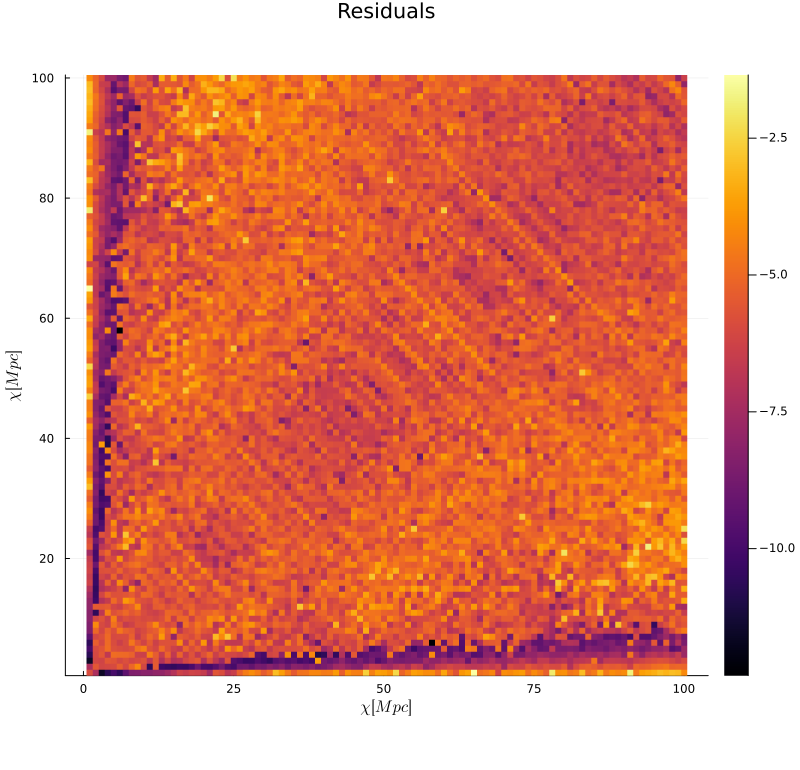

In [16]:
heatmap(log10.(abs.(1 .- result_brute_5./w[1,:,:])), aspect_ratio=1, size=[800,770], xlabel=L"\chi [Mpc]", ylabel=L"\chi [Mpc]", title="Residuals")

In [17]:
sum(result_brute_5)

0.0001999531298657046

In [18]:
sum(w[1,:,:])

0.00019995318877758685

In [19]:
println("Percentual difference: ", 100*(1 .- sum(result_brute_5) ./ sum(w[1,:,:]) ), "%")

Percentual difference: 2.9462837092264493e-5%


# $\ell = 100$

In [20]:
T = npzread("T_tilde/T_tilde_l_100.npy");

In [21]:
ℓ = 100
nχ = 100
χ = LinRange(13, 7000, nχ)

100-element LinRange{Float64, Int64}:
 13.0, 83.5758, 154.152, 224.727, …, 6788.27, 6858.85, 6929.42, 7000.0

In [22]:
w = Will.w_ell_tullio(coeff,T);

In [23]:
@benchmark Will.w_ell_tullio(coeff,T)

BenchmarkTools.Trial: 10000 samples with 1 evaluation.
 Range (min … max):  445.500 μs …  3.455 ms  ┊ GC (min … max): 0.00% … 66.86%
 Time  (median):     463.166 μs              ┊ GC (median):    0.00%
 Time  (mean ± σ):   472.114 μs ± 74.598 μs  ┊ GC (mean ± σ):  0.40% ±  2.33%

    ▁▇██▇▃                                                      
  ▂▄██████▇▅▄▃▃▃▂▂▂▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▂▂▂▂▂ ▃
  446 μs          Histogram: frequency by time          632 μs <

 Memory estimate: 80.75 KiB, allocs estimate: 49.

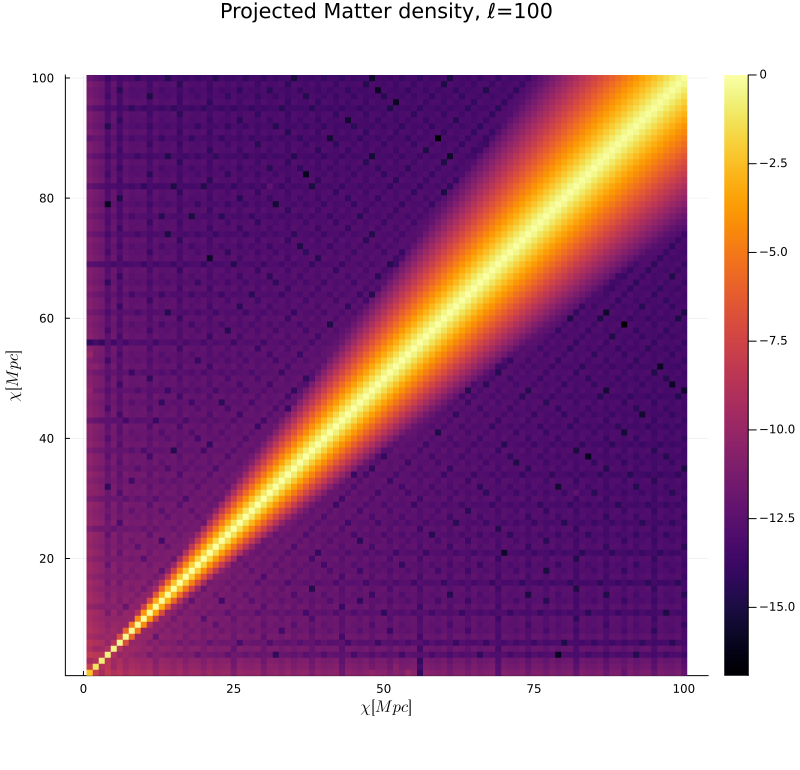

In [24]:
heatmap(log10.(abs.(w[1,:,:]./maximum(w[1,:,:]))), aspect_ratio=1, size=[800,770], xlabel=L"\chi [Mpc]", ylabel=L"\chi [Mpc]", title="Projected Matter density, ℓ=100")

### Comparison with brute force integral

result_brute_100 = zeros(nχ, nχ)
brute_w!(result_brute_100, ℓ, χ, kmin, kmax)

In [25]:
result_brute_100 = npzread("w_brute/w_l_100_brute.npy");

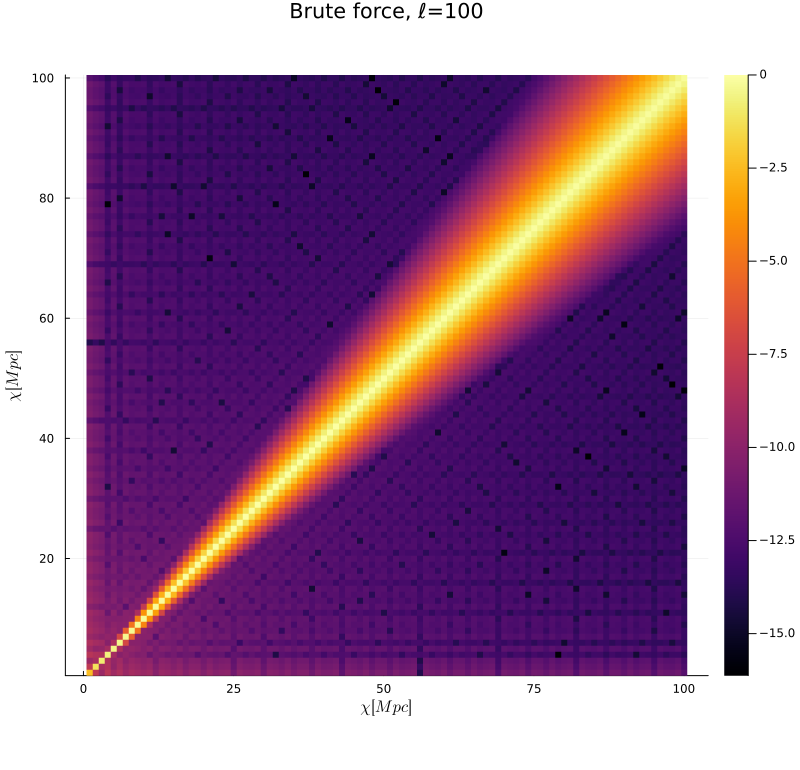

In [26]:
heatmap(log10.(abs.(result_brute_100/maximum(result_brute_100))), aspect_ratio=1, size=[800,770], xlabel=L"\chi [Mpc]", ylabel=L"\chi [Mpc]", title="Brute force, ℓ=100")

npzwrite("w_l_100_brute.npy", result_brute_100)

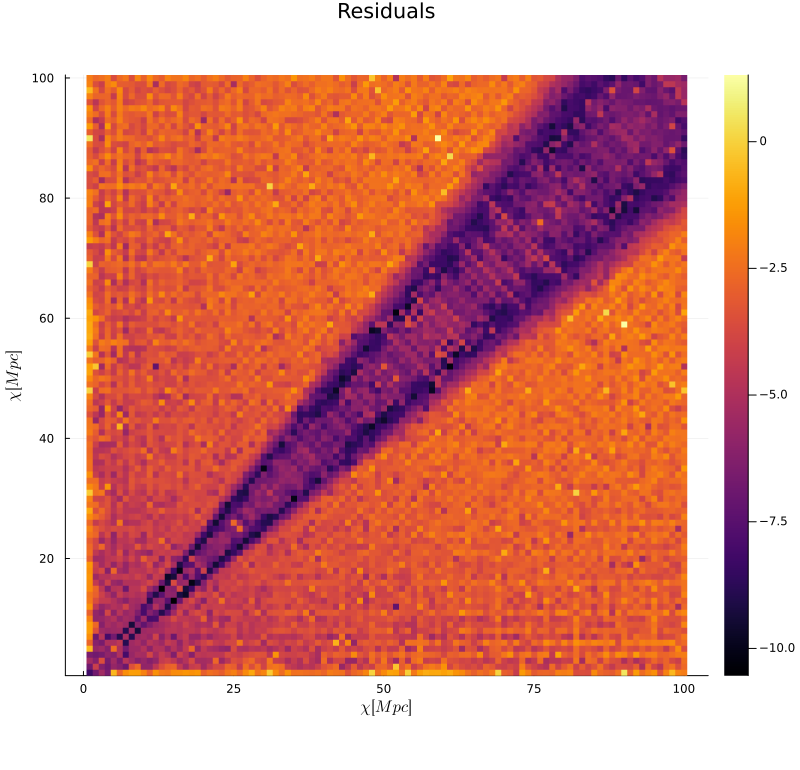

In [27]:
heatmap(log10.(abs.(1 .- result_brute_100./w[1,:,:])), aspect_ratio=1, size=[800,770], xlabel=L"\chi [Mpc]", ylabel=L"\chi [Mpc]", title="Residuals")

In [28]:
sum(w[1,:,:])

1.5040460640154327e-6

In [29]:
sum(result_brute_100)

1.504011442764375e-6

In [30]:
println("Percentual difference: ", 100*(1 .- sum(result_brute_100) ./ sum(w[1,:,:]) ), "%")

Percentual difference: 0.002301874383103808%


# $\ell = 200$

In [31]:
T = npzread("T_tilde/T_tilde_l_200.npy");

In [32]:
ℓ = 200
nχ = 100
χ = LinRange(13, 7000, nχ)

100-element LinRange{Float64, Int64}:
 13.0, 83.5758, 154.152, 224.727, …, 6788.27, 6858.85, 6929.42, 7000.0

In [33]:
w = Will.w_ell_tullio(coeff,T);

In [34]:
@benchmark Will.w_ell_tullio(coeff,T)

BenchmarkTools.Trial: 9259 samples with 1 evaluation.
 Range (min … max):  448.250 μs …  15.170 ms  ┊ GC (min … max): 0.00% … 0.00%
 Time  (median):     472.417 μs               ┊ GC (median):    0.00%
 Time  (mean ± σ):   533.562 μs ± 270.650 μs  ┊ GC (mean ± σ):  0.31% ± 2.26%

  ██▇▆▄▄▂▁                        ▁▁                            ▂
  █████████████▇▇▆▆▆▆▆▆▅▆▇█████████████████▇▇█▇▇▆▅▆▆▆▆▄▅▅▅▄▅▄▃▅ █
  448 μs        Histogram: log(frequency) by time       1.18 ms <

 Memory estimate: 80.75 KiB, allocs estimate: 49.

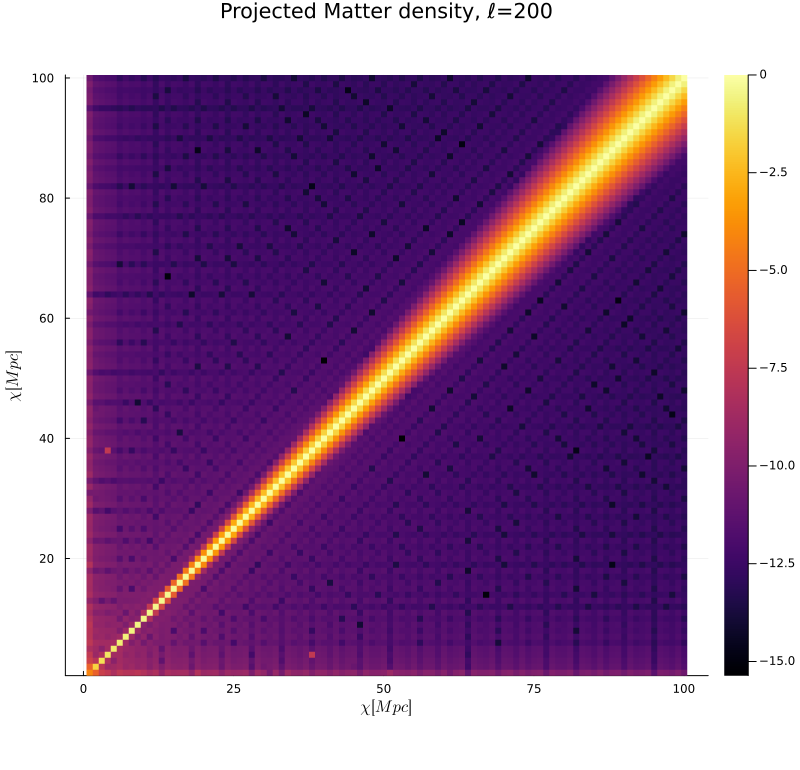

In [35]:
heatmap(log10.(abs.(w[1,:,:]./maximum(w[1,:,:]))), aspect_ratio=1, size=[800,770], xlabel=L"\chi [Mpc]", ylabel=L"\chi [Mpc]", title="Projected Matter density, ℓ=200")

### Comparison with brute force integral

result_brute_200 = zeros(nχ, nχ)
brute_w!(result_brute_200, ℓ, χ, kmin, kmax)

In [36]:
result_brute_200 = npzread("w_brute/w_l_200_brute.npy");

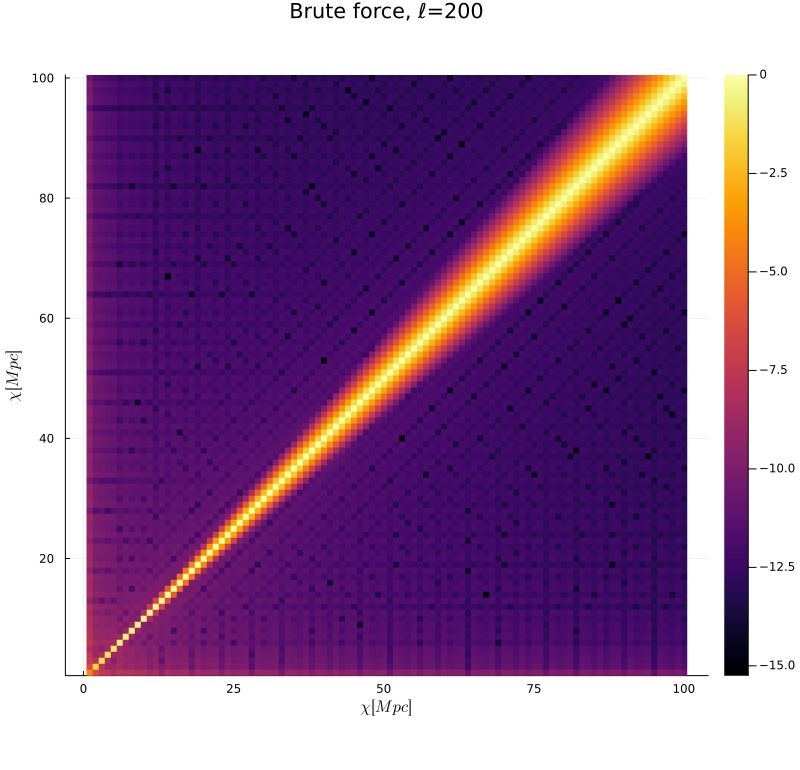

In [37]:
heatmap(log10.(abs.(result_brute_200/maximum(result_brute_200))), aspect_ratio=1, size=[800,770], xlabel=L"\chi [Mpc]", ylabel=L"\chi [Mpc]", title="Brute force, ℓ=200")

npzwrite("w_l_200_brute.npy", result_brute_200)

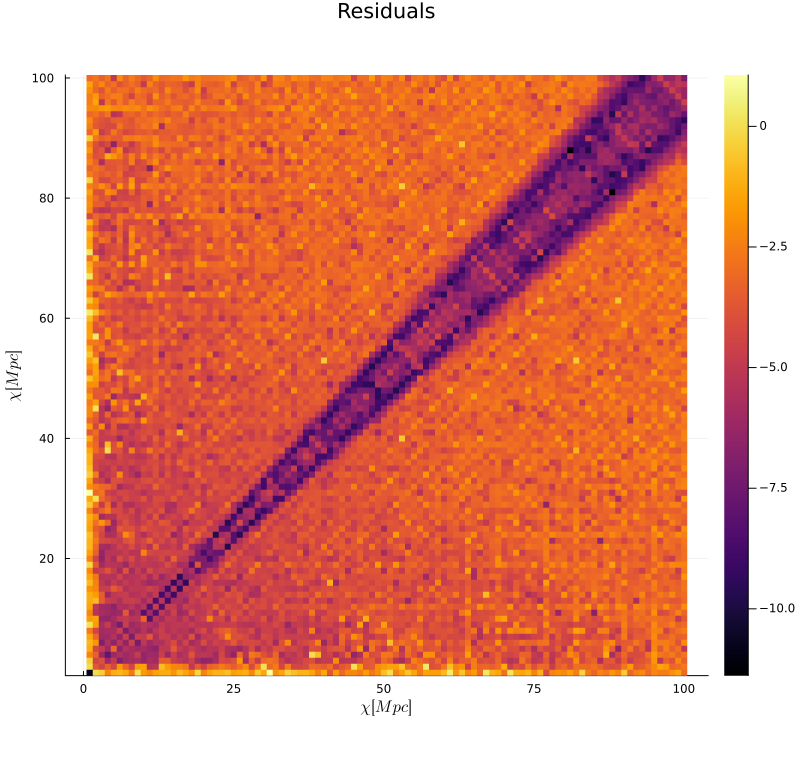

In [38]:
heatmap(log10.(abs.(1 .- result_brute_200./w[1,:,:])), aspect_ratio=1, size=[800,770], xlabel=L"\chi [Mpc]", ylabel=L"\chi [Mpc]", title="Residuals")

In [39]:
sum(result_brute_200)

2.872433860068523e-7

In [40]:
sum(w[1,:,:])

2.8724483763739133e-7

In [41]:
println("Percentual difference: ", 100*(1 .- sum(result_brute_200) ./ sum(w[1,:,:]) ), "%")

Percentual difference: 0.0005053634909435445%


# Full $\ell$ range test

In [42]:
function load_Ts(nχ, n_cheb, ell_list="ell_vector.npy")
    ell_vector = npzread(ell_list) 
    full_T = zeros(length(ell_vector), nχ, nχ, n_cheb+1)
    for i in 1:length(ell_vector)
        l_string = string(round(ell_vector[i]; digits=1))
        filename = "T_tilde/T_tilde_l_$l_string.npy"
        full_T[i,:,:,:] = npzread(filename)
    end
    return full_T
end

function load_ws(nχ, ell_list="ell_vector.npy")
    ell_vector = npzread(ell_list) 
    full_w = zeros(length(ell_vector), nχ, nχ)
    for i in 1:length(ell_vector)
        l_string = string(round(ell_vector[i]; digits=1))
        filename = "w_brute/w_brute_l_$l_string.npy"
        full_w[i,:,:] = npzread(filename)
    end
    return full_w
end

load_ws (generic function with 2 methods)

In [43]:
T_tot = load_Ts(nχ,n_cheb)
ws_brute = load_ws(nχ);

In [44]:
ws_cheb = Will.w_ell_tullio(coeff, T_tot);

In [45]:
function plot_comparison(w1, w2, i, ell_list="ell_vector.npy")
    ell_vector = npzread(ell_list)
    ℓ = round(ell_vector[i], digits=1)
    plot1 = heatmap(log10.(abs.(w1[i,:,:]./maximum(w1[i,:,:]))), aspect_ratio=1, size=[3000,700], xlabel=L"\chi [Mpc]", ylabel=L"\chi [Mpc]", title="Projected Matter density, ℓ=$(ℓ)")
    plot2 = heatmap(log10.(abs.(w2[i,:,:]./maximum(w2[i,:,:]))), aspect_ratio=1, size=[3000,700], xlabel=L"\chi [Mpc]", ylabel=L"\chi [Mpc]", title="Brute force, ℓ=$(ℓ)")
    plot3 = heatmap(log10.(abs.(1 .- w1[i,:,:] ./ w2[i,:,:])), aspect_ratio=1, size=[3000,700], xlabel=L"\chi [Mpc]", ylabel=L"\chi [Mpc]", title="Residuals")
    return plot_layout = plot(plot1, plot2, plot3, layout=(1,3))
end;

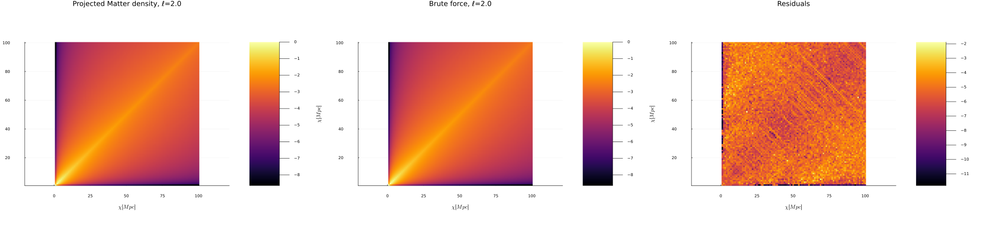

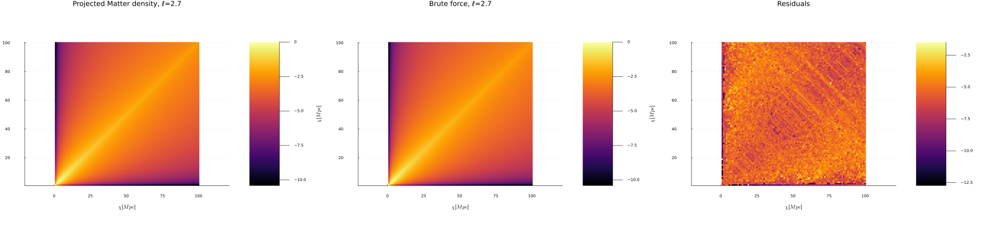

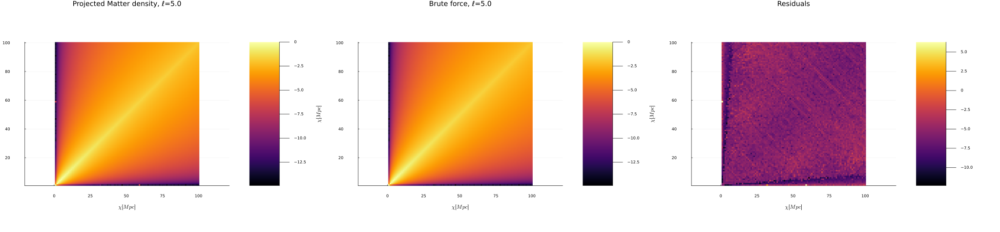

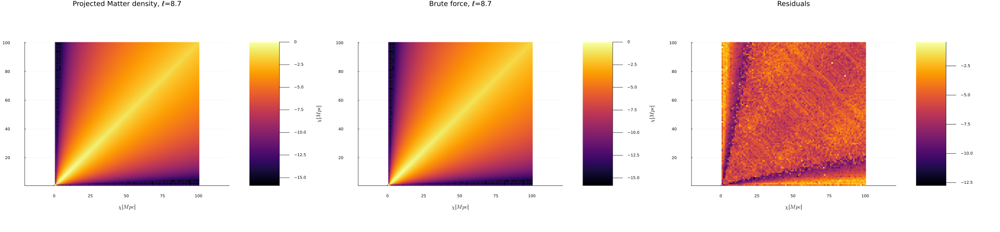

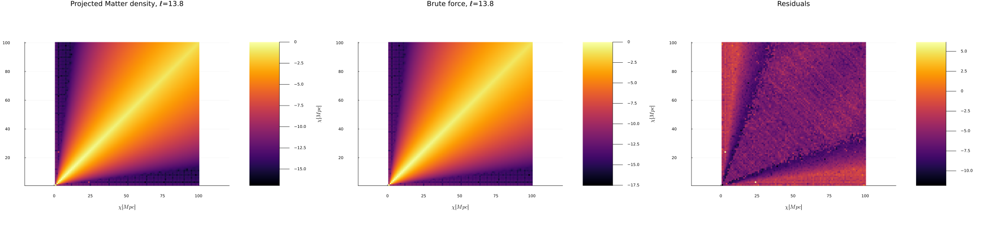

...

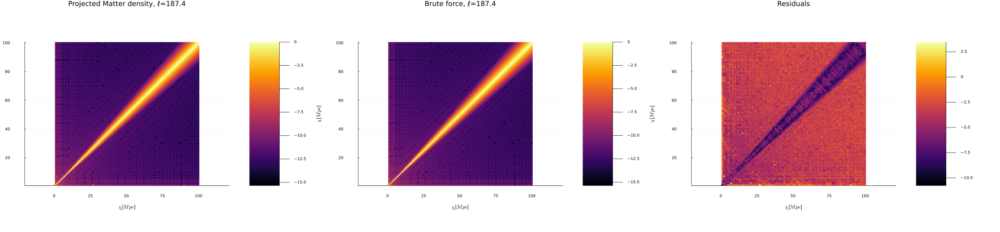

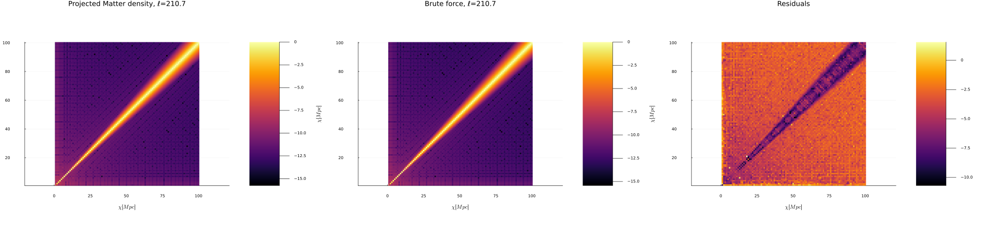

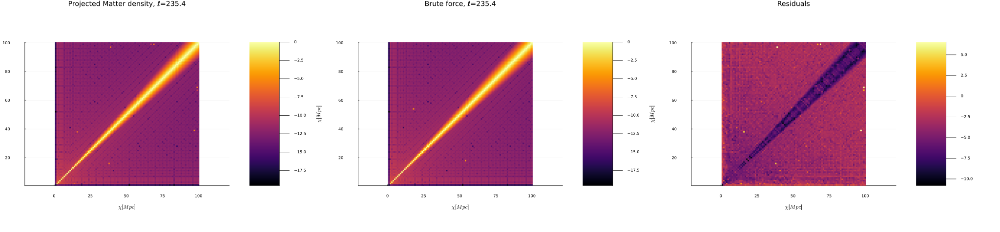

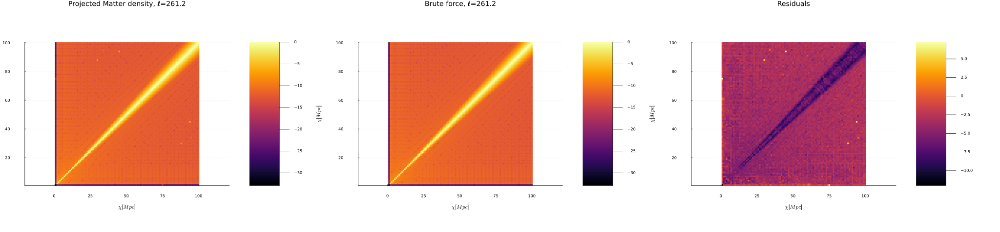

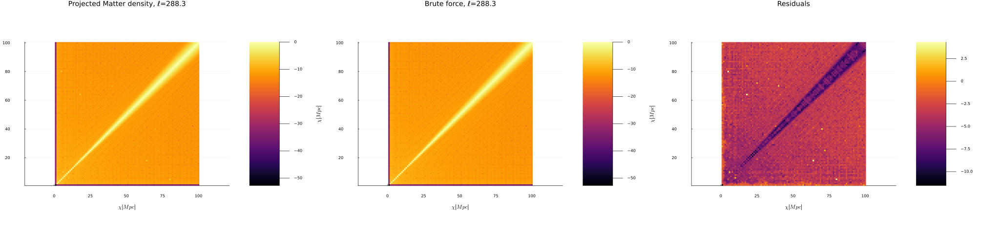

In [46]:
plots = []
for i in 1:21
    push!(plots, plot_comparison(ws_cheb, ws_brute, i))
end

for plot in plots
    display(plot)
end

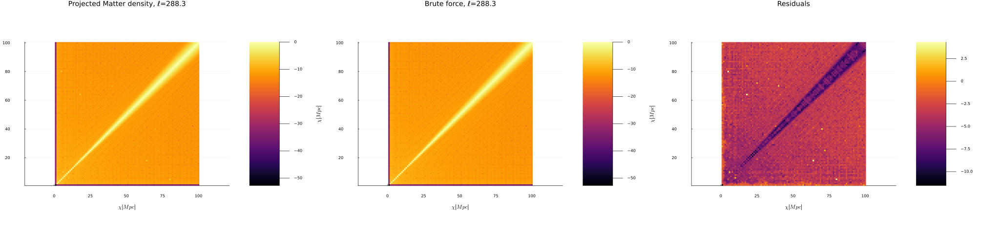

In [47]:
plot_comparison(ws_cheb, ws_brute, 21)
#savefig("benchmark_l_288.3.png");

# Now actual $C_{\ell}$ computation, with N5K windows

In [48]:
#This is the function i want to use in the end
function C_ell_computation_tullio(w, WA, WB)
    @tullio Cℓ[i,j,k] := w[i,l,m]*WA[j,l]*WB[k,m]
end

C_ell_computation_tullio (generic function with 1 method)

In [49]:
W = npzread("../N5K/input/kernels_fullwidth.npz")

Dict{String, Array{Float64}} with 6 entries:
  "chi_cl"     => [25.9606, 33.7127, 41.4584, 49.1976, 56.9303, 64.6566, 72.376…
  "kernels_sh" => [6.04145e-7 7.78856e-7 … 0.0 0.0; 6.14932e-7 7.9704e-7 … 0.0 …
  "z_sh"       => [0.00583333, 0.00757837, 0.00932341, 0.0110684, 0.0128135, 0.…
  "chi_sh"     => [25.9606, 33.7127, 41.4584, 49.1976, 56.9303, 64.6566, 72.376…
  "kernels_cl" => [0.0 1.02182e-10 … 0.0 0.0; 0.0 9.54391e-17 … 0.0 0.0; … ; 0.…
  "z_cl"       => [0.00583333, 0.00757837, 0.00932341, 0.0110684, 0.0128135, 0.…

In [50]:
WA = W["kernels_sh"]
WB = W["kernels_cl"];

### Firstly, I need the interpolant cause we have a different χ grid :(

In [51]:
χ = LinRange(13, 7000, nχ) 
WA_interp = zeros(5,100)
WB_interp = zeros(10,100)

for i in 1:5
    interp = BSplineInterpolation(WA[i,:], W["chi_sh"], 3, :ArcLen, :Average, extrapolate=true)
    WA_interp[i,:] = interp.(χ)
end

for i in 1:10
    interp = BSplineInterpolation(WB[i,:], W["chi_cl"], 3, :ArcLen, :Average, extrapolate=true)
    WB_interp[i,:] = interp.(χ)
end

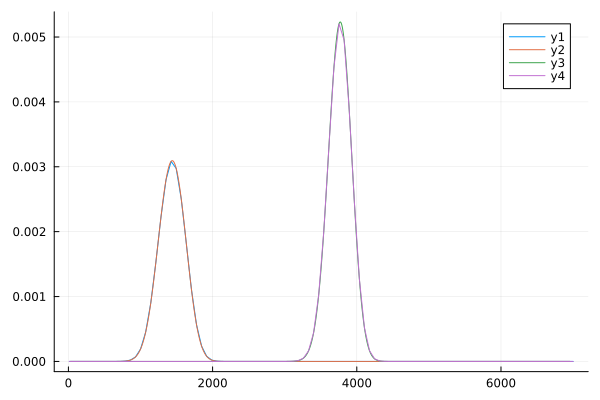

In [52]:
plot(χ, WB_interp[2,:])
plot!(W["chi_cl"], WB[2,:])
plot!(W["chi_cl"], WB[10,:])
plot!(χ, WB_interp[10,:])

## LENSING-LENSING

In [53]:
Cℓ_cheb = C_ell_computation_tullio(ws_cheb, WA_interp, WA_interp)
Cℓ_brute = C_ell_computation_tullio(ws_brute, WA_interp, WA_interp);

In [54]:
npzwrite("C_LL_cheb.npy", Cℓ_cheb)
npzwrite("C_LL_brute.npy", Cℓ_brute)

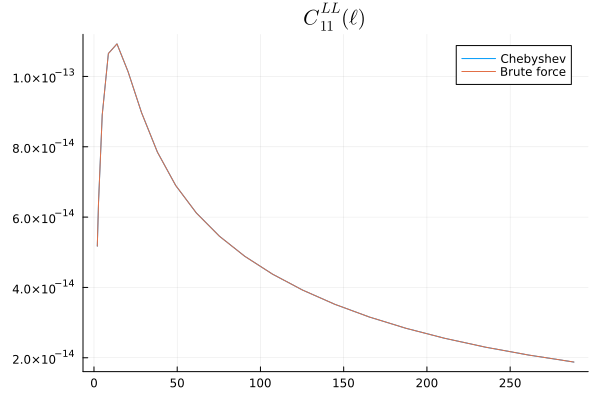

In [55]:
ℓ= npzread("ell_vector.npy")
plot(ℓ, Cℓ_cheb[:,1,1] .* ℓ .* (ℓ .+ 1), label = "Chebyshev", title=L"$C_{11}^{LL}(\ell)$")
plot!(ℓ, Cℓ_brute[:,1,1] .* ℓ .* (ℓ .+ 1), label ="Brute force")
#savefig("C_LL_55.png");

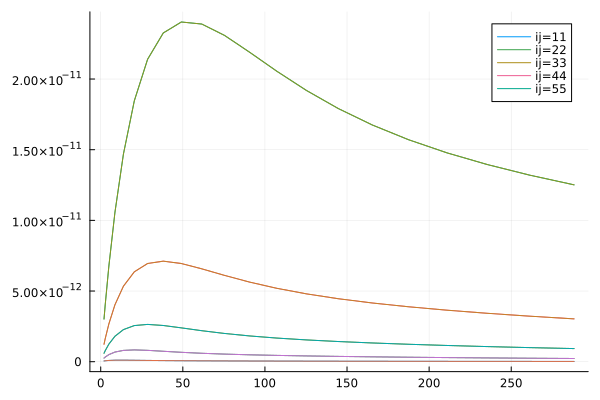

In [56]:
p = plot()
for i in 1:5
    plot!(p,ℓ, Cℓ_cheb[:,i,i] .* ℓ .* (ℓ .+ 1), label = "ij=" * string(i)*string(i))
    plot!(p,ℓ, Cℓ_brute[:,i,i] .* ℓ .* (ℓ .+ 1), label= nothing)
end
p

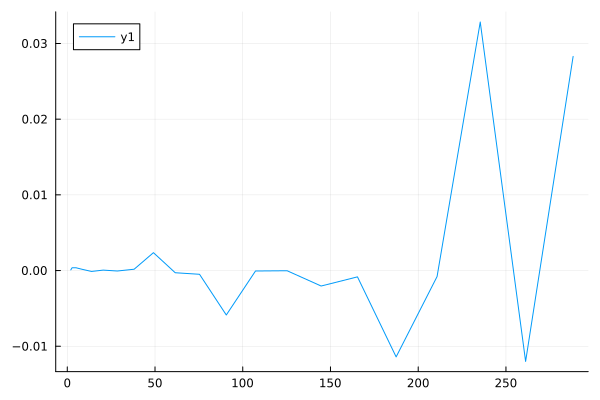

In [57]:
plot(ℓ, 100 .* (1 .- Cℓ_cheb[:,1,1] ./ Cℓ_brute[:,1,1] ))

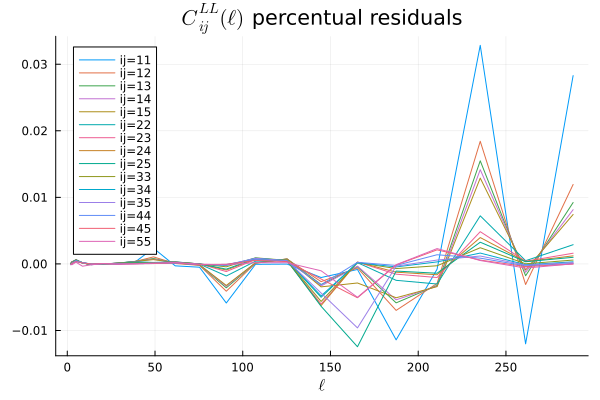

In [58]:
p = plot(title=L"$C_{ij}^{LL}(\ell)$ percentual residuals", xlabel=L"\ell")
for i in 1:5
    for j in i:5
        plot!(p, ℓ, 100 .* (1 .- Cℓ_cheb[:,i,j] ./ Cℓ_brute[:,i,j] ), label= "ij=" * string(i) * string(j))
    end
end
p
#savefig("LL_residuals.png")

## CLUSTERING-CLUSTERING

In [65]:
Cℓ_cheb = C_ell_computation_tullio(ws_cheb, WB_interp, WB_interp)
Cℓ_brute = C_ell_computation_tullio(ws_brute, WB_interp, WB_interp);

In [66]:
npzwrite("C_CC_cheb.npy", Cℓ_cheb)
npzwrite("C_CC_brute.npy", Cℓ_brute)

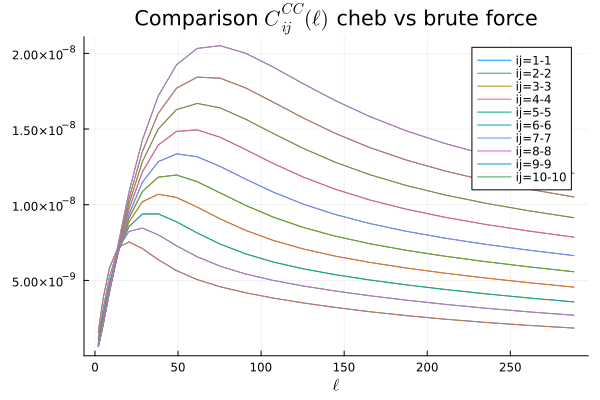

In [67]:
p = plot(title=L"Comparison $C_{ij}^{CC}(\ell)$ cheb vs brute force", xlabel=L"\ell")
for i in 1:10
    plot!(p,ℓ, Cℓ_cheb[:,i,i] .* ℓ .* (ℓ .+ 1), label = "ij=" * string(i)*"-"*string(i))
    plot!(p,ℓ, Cℓ_brute[:,i,i] .* ℓ .* (ℓ .+ 1), label= nothing)
end
p
#savefig("C_CC_ij.png")

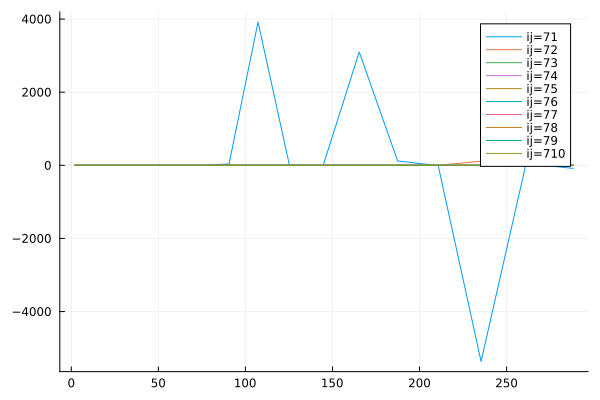

In [68]:
p = plot()
for i in 7:7
    for j in 1:10
        plot!(p, ℓ, 100 .* (1 .- Cℓ_cheb[:,i,j] ./ Cℓ_brute[:,i,j] ), label= "ij=" * string(i) * string(j))
    end
end
p

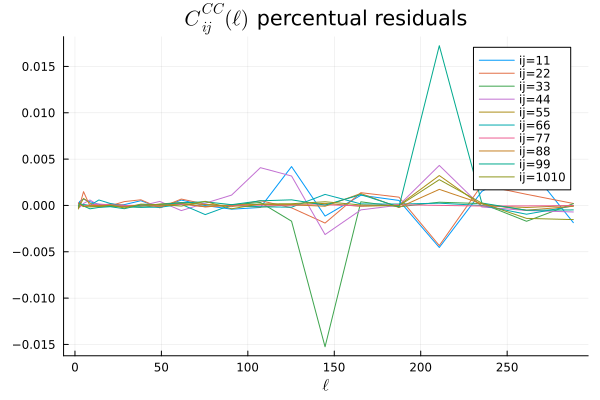

In [69]:
p = plot(title=L"$C_{ij}^{CC}(\ell)$ percentual residuals", xlabel=L"\ell")
for i in 1:10
    plot!(p, ℓ, 100 .* (1 .- Cℓ_cheb[:,i,i] ./ Cℓ_brute[:,i,i] ), label= "ij=" * string(i) * string(i))
end
p
#savefig("CC_residuals.png")

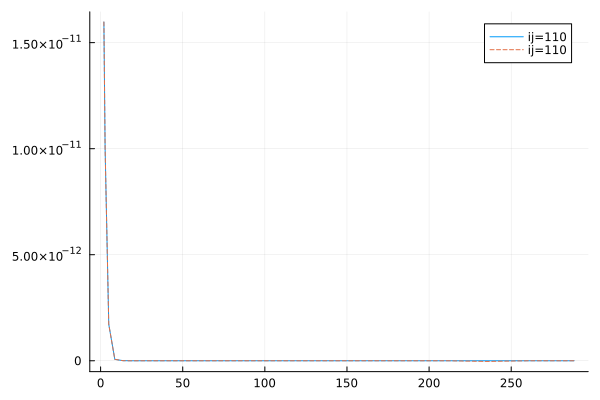

In [70]:
i = 1
j = 10
plot(ℓ, Cℓ_cheb[:,i,j] .* ℓ .* (ℓ .+ 1), label = "ij=" * string(i)*string(j))
plot!(ℓ, Cℓ_brute[:,i,j] .* ℓ .* (ℓ .+ 1), label = "ij=" * string(i)*string(j), linestyle=:dash)

## LENSING-CLUSTERING

In [93]:
Cℓ_cheb = C_ell_computation_tullio(ws_cheb, WA_interp, WB_interp)
Cℓ_brute = C_ell_computation_tullio(ws_brute, WA_interp, WB_interp);

npzwrite("C_CL_cheb.npy", Cℓ_cheb)
npzwrite("C_CL_brute.npy", Cℓ_brute)

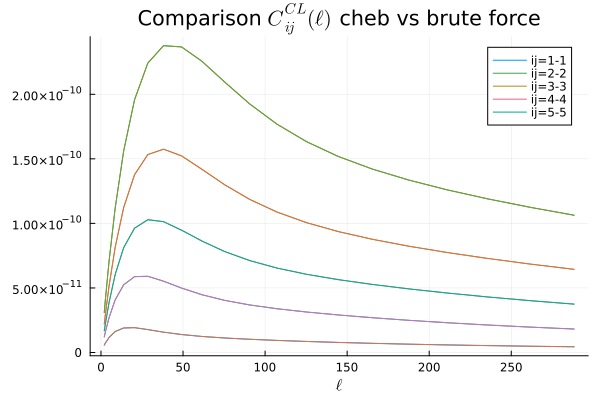

In [73]:
p = plot(title=L"Comparison $C_{ij}^{CL}(\ell)$ cheb vs brute force", xlabel=L"\ell")
for i in 1:5
    plot!(p,ℓ, Cℓ_cheb[:,i,i] .* ℓ .* (ℓ .+ 1), label = "ij=" * string(i)*"-"*string(i))
    plot!(p,ℓ, Cℓ_brute[:,i,i] .* ℓ .* (ℓ .+ 1), label= nothing)
end
p
#savefig("C_CL_ij.png");

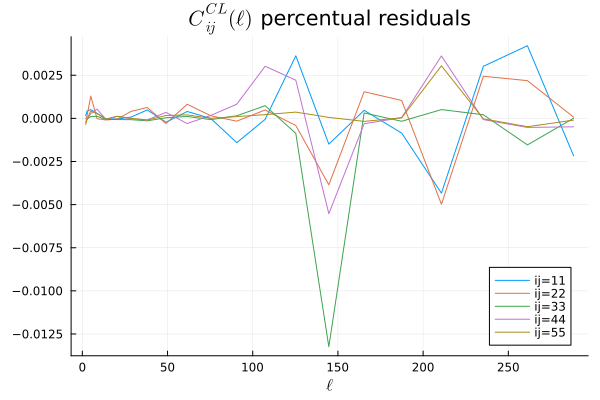

In [74]:
p = plot(title=L"$C_{ij}^{CL}(\ell)$ percentual residuals", xlabel=L"\ell")
for i in 1:5
        plot!(p, ℓ, 100 .* (1 .- Cℓ_cheb[:,i,i] ./ Cℓ_brute[:,i,i] ), label= "ij=" * string(i) * string(i))
    end
p
#savefig("CL_residuals.png")

### KNOX FORMULA

The idea is to compare the error with the expected cosmic variance: $$\sigma^{AB}_{ij}(\ell) = \sqrt{\frac{C^{AA}_{ii}(\ell)C^{BB}_{jj}(\ell) + (C^{AB}_{ij}(\ell))^2}{f_{sky}(2 \ell +1)}}$$

Then, the Mean Absolute Error Ratio is such defined: $$MAER_{ij}^{AB}(\ell) = \frac{100}{N_{C(\ell)}} \frac{|C_{ij,Cheb}^{AB}(\ell) - C_{ij,GT}^{AB}(\ell)|}{\sigma^{AB}_{ij}(\ell)} $$


In [131]:
function cosmic_variance(tracer1, tracer2)
    ell_vector = npzread("ell_vector.npy")
    if tracer1 == tracer2
        filename = "Cl_benchmark1/C_"* tracer1*tracer2* "_brute.npy"
        C_ells = npzread(filename)
        σ = zeros(size(C_ells)[1], size(C_ells)[2], size(C_ells)[3])

        for k in 1:size(C_ells)[1]
            for i in 1:size(C_ells)[2]
                for j in i:size(C_ells)[3]
                    σ[k,i,j] = sqrt((C_ells[k,i,i]*C_ells[k,j,j] + C_ells[k,i,j]^2)/(2*ell_vector[k]+1))
                    σ[k,j,i] = σ[k,i,j]
                end
            end
        end
    else
        C_CC = npzread("Cl_benchmark1/C_CC_brute.npy")
        C_LL = npzread("Cl_benchmark1/C_LL_brute.npy")
        C_CL = npzread("Cl_benchmark1/C_CL_brute.npy")
        σ = zeros(size(C_CL)[1], size(C_CL)[2], size(C_CL)[3])
        for k in 1:size(C_CL)[1]
            for i in 1:size(C_CL)[2]
                for j in 1:size(C_CL)[3]
                    σ[k,i,j] = sqrt((C_LL[k,i,i]*C_CC[k,j,j] + C_CL[k,i,j]^2)/(2*ell_vector[k]+1))
                end
            end
        end
    end
    return σ
end;

In [132]:
function MAER(tracer1, tracer2)
    file_cheb = "Cl_benchmark1/C_"* tracer1*tracer2* "_cheb.npy"
    C_cheb = npzread(file_cheb)
    file_brute = "Cl_benchmark1/C_"* tracer1*tracer2* "_brute.npy"
    C_brute = npzread(file_brute)
    σ = cosmic_variance(tracer1,tracer2)

    m = zeros(size(C_cheb)[1], size(C_cheb)[2], size(C_cheb)[3])
        
    for k in 1:size(C_cheb)[1]
        for i in 1:size(C_cheb)[2]
            for j in 1:size(C_cheb)[3]
                m[k,i,j] = abs(C_cheb[k,i,j]-C_brute[k,i,j]) / σ[k,i,j]
            end
        end
    end
    return m 
end;

In [133]:
MAER_CC = MAER("C","C")
MAER_LL = MAER("L","L")
MAER_CL = MAER("C","L");

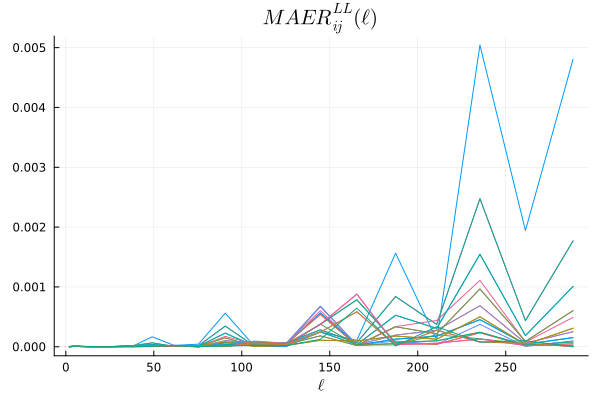

In [127]:
ℓ= npzread("ell_vector.npy")
p = plot(title=L"$MAER_{ij}^{LL}(\ell)$", xlabel=L"\ell")
for i in 1:5
    for j in 1:5
        plot!(p, ℓ, MAER_LL[:,i,j], label= nothing)
    end
end
p

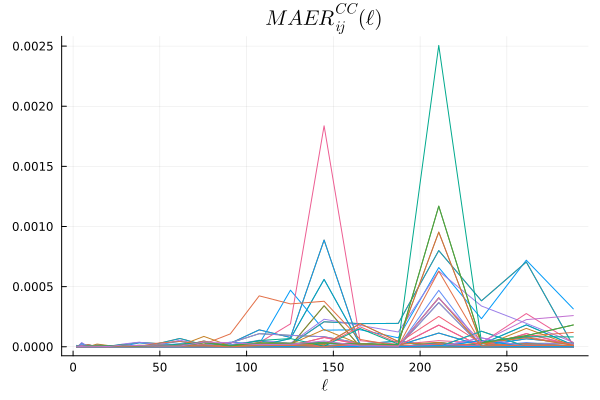

In [125]:
p = plot(title=L"$MAER_{ij}^{CC}(\ell)$", xlabel=L"\ell")
for i in 1:10
    for j in 1:10
        plot!(p, ℓ, MAER_CC[:,i,j], label=nothing)
    end
end
p

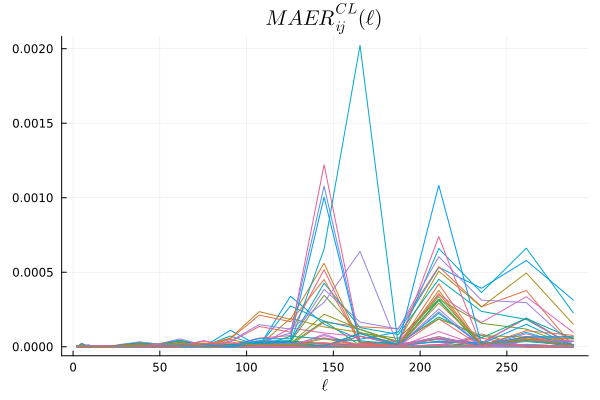

In [126]:
p = plot(title=L"$MAER_{ij}^{CL}(\ell)$", xlabel=L"\ell")
for i in 1:5
    for j in 1:10
        plot!(p, ℓ, MAER_CL[:,i,j], label= nothing)
    end
end
p